In [2]:
! pip install -Uqq duckduckgo_search diffusers transformers fastcore

In [3]:
from duckduckgo_search import DDGS
from fastcore.all import *
from fastdownload import download_url
from fastai.vision.all import *
from IPython.display import Image
from fastai.vision.widgets import *
from IPython.display import Image
import logging
from pathlib import Path
import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

We'll use the DuckDuckGo image search API to get our training and validation data. It produces a list of results each of which contains a URL for the source image, and below we'll download the images from those urls into directories that are named with the label of the data inside of it.

In [29]:
search = DDGS()

In [30]:
res = search.images(keywords = 'van gosh painting', max_results=1)

Here's what an example result from the API looks like (if you're wondering why it says source=Bing, so am I):

In [31]:
res

[{'title': "Van Gogh's Most Famous Paintings",
  'image': 'https://www.thoughtco.com/thmb/b8af_T0ihCV7kXui8HDq5iZ8jHg=/5694x4558/filters:no_upscale():max_bytes(150000):strip_icc()/VanGoghStarryNight02Getty544182028-5a14c855ec2f6400377ca5e9.jpg',
  'thumbnail': 'https://tse2.mm.bing.net/th?id=OIP.iuog0CplLlQ2E3MrVwJPfQHaF7&pid=Api',
  'url': 'https://www.thoughtco.com/greatest-paintings-by-van-gogh-4154730',
  'height': 4558,
  'width': 5694,
  'source': 'Bing'}]

In [32]:
dest_fname = 'downloads/vangogh1.jpg'
download_url(res[0]['image'], dest_fname)

Path('downloads/vangogh1.jpg')

And here's a sample image after downloading it. Look familiar?

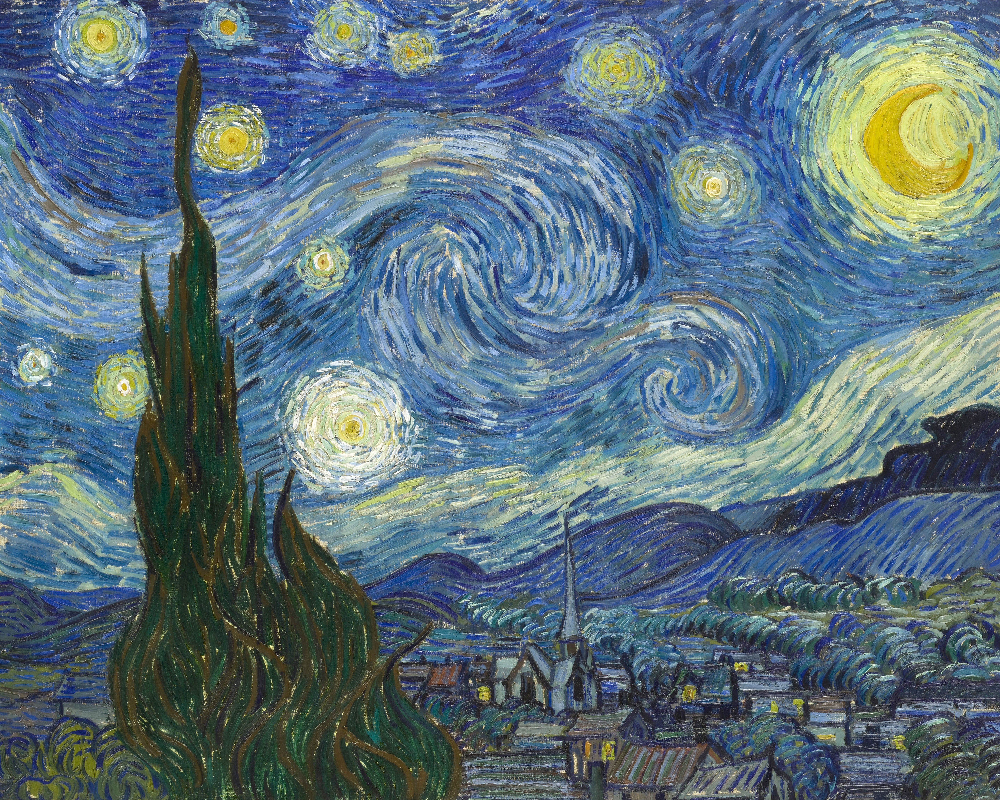

In [33]:
Image(dest_fname, height=256, width=256)

We'll use these search queries to find images for the respective labels. Note that we're going to classify painting _in the style of_ the respective artist, not just _by_ them.  Whatever the internet decides is "in the style of" Van Gogh, that will influence our model.

In [34]:
label_to_query_map = {
    'da_vinci': 'paintings in the style of Leonardo da Vinci',
    'picasso': 'paintings in the style of Pablo Picasso',
    'van_gogh' : 'paintings in the style of Vincent Van Gogh',
}

In [4]:
data_path = Path('data')
data_path.mkdir(exist_ok=True)

Looks like when I was downloading the images, my search query was, for example, "paintings in the style of Leonardo da Vinci _painting_". Oops! Anyway, it seems to have worked so I'm not going to re-run and go through the data curation process again.

In [36]:
if len(data_path.ls()) == 0:
    max_results=1000
    for label, query in label_to_query_map.items():
        dest = data_path/label
        dest.mkdir(exist_ok=True)
        img_urls = [res['image'] for res in search.images(keywords = f"{query} painting", max_results = max_results)]
        download_images(dest, urls=img_urls)
        resize_images(dest, max_size=400, dest=dest)


In [37]:
[(label, len((data_path/label).ls())) for label in label_to_query_map.keys()]

[('da_vinci', 333), ('picasso', 338), ('van_gogh', 323)]

This helper method from fastai identifies broken image files so we can remove them.

In [38]:
failed = verify_images(get_image_files(data_path))

In [39]:
len(failed)

0

In [40]:
failed.map(Path.unlink)

(#0) []

Here is the part of fastai that's doing a lot of heavy lifting:
 - `blocks` tells the framework that the input to the neural net will be a tensor representing an image, and the output should be a tensor representing softmax confidences over category indexes.
 - `get_items` instructs it to retrieve the data by extracting all the image files from a directory we'll provide to it.
 - `splitter` instructs it to randomly split the data into an 80% training, 20% validation split
 - `get_y` instructs the framework to use the name of the parent directory of the image file as its category label.
 - `item_tfms` instructs the model to resize the images into a consistent size. This has to be done on an item-by-item basis and not a batch transformation because a batch transformation can only work when the images are all already the same size to fit into a tensor with each other.
 - `dataloaders` creates a little holder object to hold on to a training "DataLoader" and a validation "DataLoader", each of which is an iterable that lets the SGD loop iterate over batches of data that have been pre-processed into tensors and transformed with all the augmentations.
 
We're not doing any augmentation with this data. After we've cleaned it up a bit, we will.

In [41]:
data_loaders = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct = 0.2),
    get_y = parent_label,
    item_tfms = [Resize(192, method='squish')]
).dataloaders(data_path)

Let's look at how imperfect out data is. We see on the bottom row a result for 'da vinci' which is really a collage of paintings by many artists, and on the top the little grid of hearts for van gogh. These don't reflect well the categories we're trying to classify so we're going to prune the data.

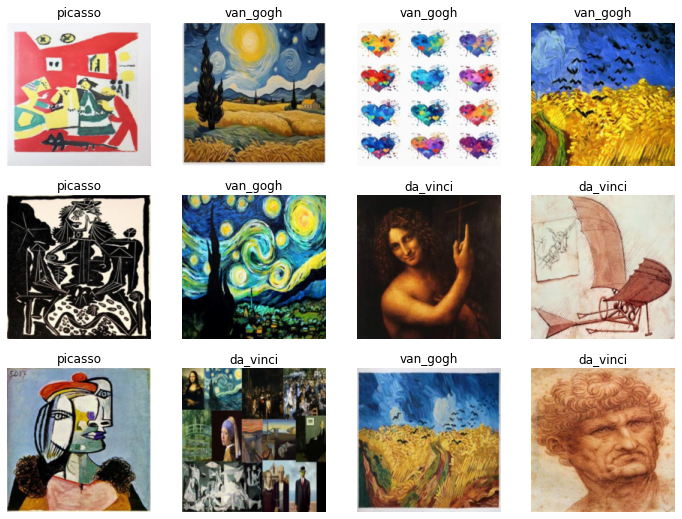

In [42]:
data_loaders.show_batch(max_n=12)

We could certainly go through nearly 1000 files manually to filter out the low-quality images, but we'll instead use a little bit more systematic of an approach. First, train a classifier a little bit, on the uncleaned data.

The Learner object created below is a bit of a convenience wrapper which exposes:
 - `learner.dls` - easy access to the data loaders used to train the model, which is convenient because later when we export and reload the model from disk, it will have the label vocabulary and preprocessed training and validation data, baked in.
 - `learner.predict(image)` - a quick method to generate predictions on an image represented by a filepath, tensor, or more.
 - `fine_tune` is a convenience method with lots of defaults set which does transfer learning on the model in an SGD loop.
 
If I'm not mistaken, I think the learner initialization is the part that will chop off the final softmax layer for the 1000 ImageNet categories that Resnet34 was originally trained on, and replaces it with a layer that predicts just three categories, based on the length of `data_loaders.vocab`. This step has to be taken somewhere, and we'd be doing it ourselves if we were working directly with PyTorch.

In [45]:
model_to_fine_tune = resnet34
learner = vision_learner(data_loaders, model_to_fine_tune, metrics=error_rate)


 If you wanted, you could pass in custom learning rate schedulers, optimizers like AdamW, etc by calling the learner's `fit` method directly.
 
 The way `fine_tune` works by default is it:
  1. Freezes all layers in the neural net _except_ the last layer
  1. Trains 1 epoch just to quickly adapt the weights of the last layer to utilize the rich concepts already outputted by the prior layer and learn to make sense of those in predicting the new categories.
  1. Unfreezes all the layers
  1. Trains the requested number of epochs (in this case, 10).

In [46]:
learner.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.501038,0.500782,0.169231,00:04


epoch,train_loss,valid_loss,error_rate,time
0,0.570546,0.506763,0.169231,00:04
1,0.398474,0.379621,0.143590,00:04
2,0.271275,0.438046,0.112821,00:04
3,0.205862,0.326079,0.092308,00:04
4,0.163501,0.450454,0.112821,00:05
5,0.132309,0.476957,0.102564,00:04
6,0.104608,0.434409,0.112821,00:04
7,0.086550,0.440861,0.107692,00:04
8,0.070820,0.433706,0.107692,00:04
9,0.059612,0.430715,0.107692,00:04


Now we'll pass our slightly-trained model into a widget which do a few things:
 - Use the `dls` attribute of the learner to iterate over each image in both the training and validation sets.
 - Make a prediction for each image and calculate a loss for that prediction, compared to the true label, using the model's own loss function
 - Showcase a UI that displays the images with the highest loss, broken down by train/valid dataset, and by label.
 - Let you manually choose to either delete an image, or recategorize it (re-label a da vinci as a van gogh, for instance).
 
It displays the highest loss images because, even though our model was trained on imperfect data, there is a good chance that the predictions with highest loss may be the result of images which fall far outside the distribution of the ostensible label of that image. This makes for a more efficient human intervention, to only manually review the files that have a signal of possibly being problematic.

Because the output of the widget doesn't seem to persist on a Notebook save, here are some screenshots of what it looks like in action:


Cleaning up Da Vinci's validation data:
<div>
<img src="clean-da-vinci.png" width="1000"/>
</div>

And then Picasso's training set:

<div>
<img src="clean-picasso.png" width="1000"/>
</div>


In [ ]:
cleaner = ImageClassifierCleaner(learner)

In [48]:
cleaner

Here's the code to see how many images we're going to delete, and how many to change categories, after using the widget above, and delete them.

In [70]:
def clean_up_the_data(cleaner):
    to_del = cleaner.delete()
    to_chg = cleaner.change()
    print(f"delete: {len(to_del)}, change: {len(to_chg)}")

    for idx in to_del: cleaner.fns[idx].unlink()
    for idx,cat in to_chg: shutil.move(str(cleaner.fns[idx]), data_path/cat)

delete: 4, change: 0


(By the way, I think due to a bug in the widget, you have to run this cleanup before changing the label or train/valid dropdowns, right after making your selections. So I ran it 6 times total for the different labels times train/valid)

In [ ]:
clean_up_the_data(cleaner)

Lets create our data loaders again (making them reload the data without the deleted images) and take a look at another sample batch:

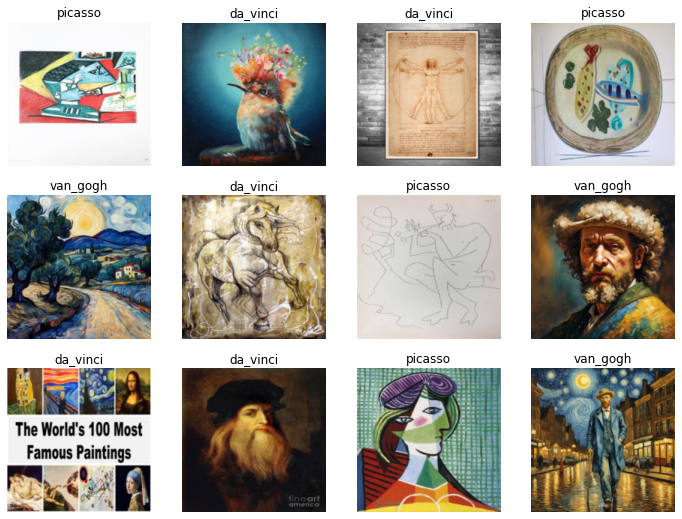

In [61]:
data_loaders = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct = 0.2),
    get_y = parent_label,
    item_tfms = [Resize(192, method='squish')]
).dataloaders(data_path)

data_loaders.show_batch(max_n=12)

Still not perfect! And without going manually through all of them, it's _going_ to be imperfect, but I'm going to repeat the same process above with a second pass. We have slightly cleaner data with apparently some of the worst outliers removed, so I'll fine tune the same model for another 10 epochs:

In [62]:
learner.dls = data_loaders
learner.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,0.047479,0.083989,0.016760,00:04


epoch,train_loss,valid_loss,error_rate,time
0,0.004934,0.033009,0.011173,00:04
1,0.005374,0.024759,0.005587,00:04
2,0.003762,0.014118,0.005587,00:04
3,0.004714,0.005797,0.000000,00:04
4,0.009997,0.044697,0.011173,00:04
5,0.015031,0.061099,0.027933,00:04
6,0.017742,0.018538,0.005587,00:04
7,0.015061,0.019807,0.005587,00:04
8,0.012776,0.021112,0.005587,00:04
9,0.011307,0.019713,0.005587,00:04


(You can trust me that the widget looks similar to how it looked before, though the UI doesn't save in the notebook).

In [63]:
cleaner = ImageClassifierCleaner(learner)
cleaner

In [ ]:
clean_up_the_data(cleaner)

We started with `[('da_vinci', 333), ('picasso', 338), ('van_gogh', 323)]`, so we've removed quite a few junkers now! But we didn't have to go through all 994 of them manually.

In [71]:
[(label, len((data_path/label).ls())) for label in label_to_query_map.keys()]

[('da_vinci', 279), ('picasso', 304), ('van_gogh', 292)]

We'll start fresh now with new data loaders to, again, pull only the remaining and correctly-labelled images, and see what they look like.

We're also going to do data augmentation. This helps regularize the model so it doesn't overlearn irrelevant details and is robust to various kinds of noisiness, being taught to learn the essential patterns. So we can see what those transforms look like too. Each batch will be different, though! Doing them as batch transforms is more performant because the transformations can be done in parallel on the entire batch.

Our augmentation includes:
 - horizontal flips
 - rotation
 - zoom in and out
 - cropping

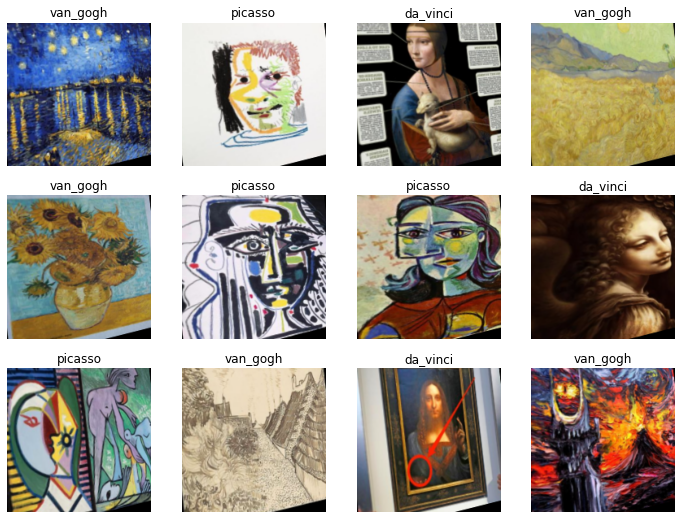

In [19]:
data_loaders = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct = 0.2),
    get_y = parent_label,
    item_tfms = [Resize(192, method='squish')],
    batch_tfms=aug_transforms(do_flip=True, max_rotate=10.0, max_zoom=1.4, min_zoom=.6, min_scale=.5, pad_mode='zeros', batch=True)
).dataloaders(data_path)

data_loaders.show_batch(max_n=12)

Notice the crops and rotations are all the same in this batch...

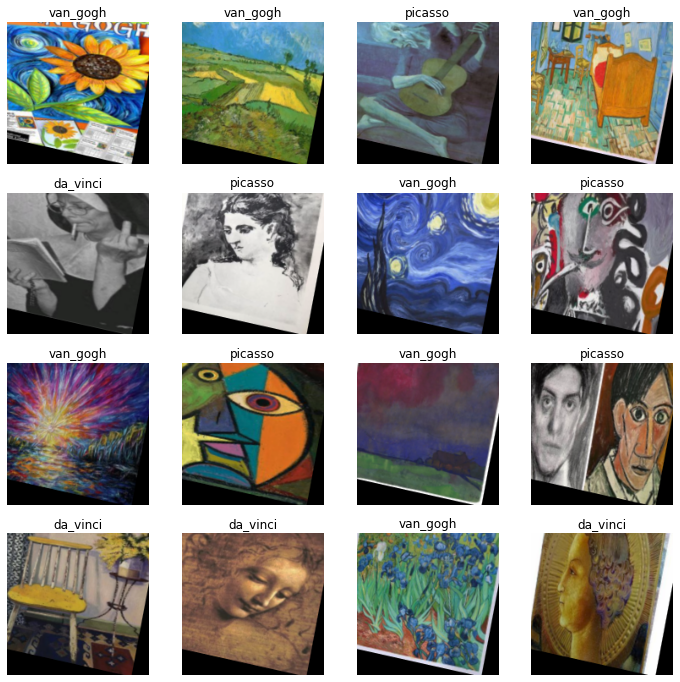

In [112]:
data_loaders.show_batch(max_n=16)

...and the next batch they're still uniform but different from the previous batch.

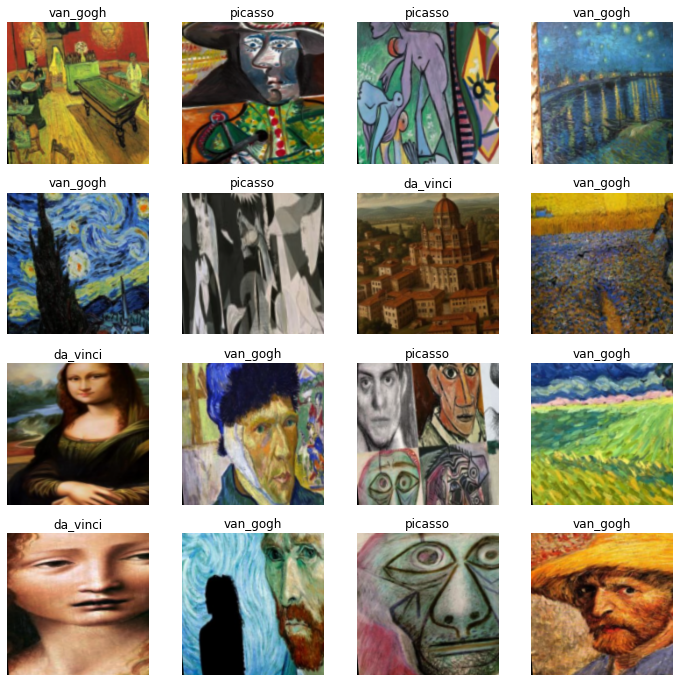

In [113]:
data_loaders.show_batch(max_n=16)

We now start from scratch, file-tuning another Resnet34 model with only the cleaned data. 

In [33]:
model_to_fine_tune = resnet34
learner = vision_learner(data_loaders, model_to_fine_tune, metrics=error_rate)
learner.fine_tune(20)

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.380928,0.527410,0.216374,00:05


epoch,train_loss,valid_loss,error_rate,time
0,0.617741,0.390052,0.157895,00:05
1,0.515738,0.361268,0.134503,00:05
2,0.444584,0.325572,0.122807,00:05
3,0.386897,0.323043,0.087719,00:05
4,0.330704,0.337124,0.087719,00:05
5,0.296278,0.291631,0.081871,00:05
6,0.246594,0.262787,0.064327,00:05
7,0.203696,0.248264,0.064327,00:05
8,0.185969,0.257343,0.081871,00:05
9,0.162962,0.324740,0.081871,00:05


Save it for later!

In [34]:
learner.export('exported_models/20240830-artist-styleof-curated.pkl')

In [35]:
learner_imported = load_learner('exported_models/20240830-artist-styleof-curated.pkl')

So how do you want to see this demo'd? If I run "Starry Night" through the model and expect you to be impressed that it predicted Van Gogh, you'd tell me that I tested using an image that was in the training data. Big problem!

I'll use Stable Diffusion to generate original pictures _in the style of_ Van Gogh, Da Vinci, and Picasso, and show you what the model predicts for them!

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

In [49]:
van_gogh = pipe("An impressionist painting of a dog in the style of Van Gogh", num_images_per_prompt=4).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [48]:
da_vinci = pipe("A renaissance painting of a person in the style of Leonardo da Vinci", num_images_per_prompt=4).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [39]:
picasso = pipe("A cubist painting of a person in the style of Picasso", num_images_per_prompt=4).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
def demo_four_images(images):
    assert len(images) == 4
    fig = plt.figure(figsize=(8,8))
    rows = 2
    cols = 2
    for i in range(4):
        predicted_lbl, predicted_idx, confidences = learner_imported.predict(PILImage(images[i]))
        label_confidence = f"{predicted_lbl}: {confidences[predicted_idx]:.2%}"
        sub = fig.add_subplot(rows, cols, i+1)
        sub.imshow(images[i])
        sub.set_title(label_confidence)
        plt.axis('off') 
    plt.show()


Huge fan of the Vincent van Dog situation here, even though we got one wrong.

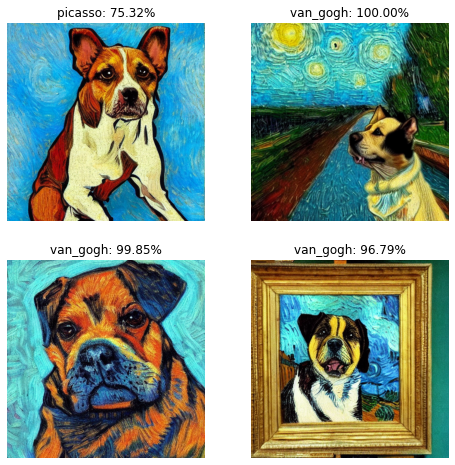

In [117]:
demo_four_images(van_gogh)

Although, just for fun, let's focus on that one that got mislabelled, and see what probability Van Gogh did get...

In [122]:
_, _, confidences = learner_imported.predict(PILImage(van_gogh[0]))

for lbl, conf in zip(data_loaders.vocab, confidences):
    print(f"{lbl}: {conf:.2%}")

da_vinci: 0.00%
picasso: 75.32%
van_gogh: 24.68%


Anyway, eye like the real Da Vanci better than these next ones:

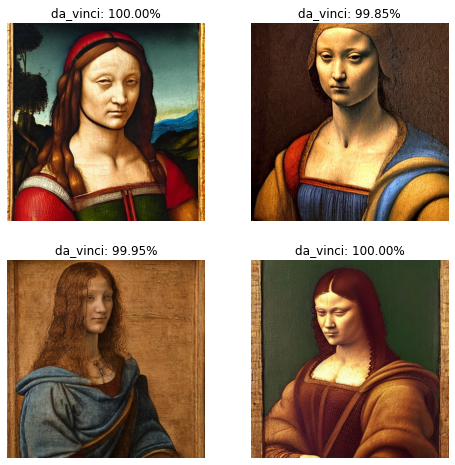

In [118]:
demo_four_images(da_vinci)

I'm currently putting prints of these on the market:

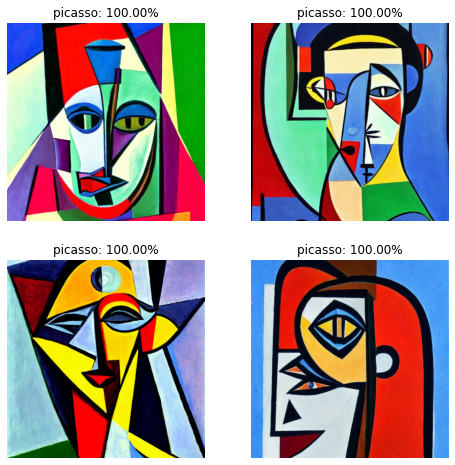

In [119]:
demo_four_images(picasso)